## Data Preparation & Splitting

In [25]:
import os
import glob
import random
import numpy as np
from PIL import Image
import tifffile
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn as nn
import torch.optim as optim
from torchvision.models import resnet18, ResNet18_Weights
from sklearn.metrics import accuracy_score
from tqdm import tqdm

random.seed(321)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# ------------------- Path Setup -------------------
input_root = "Dissertation"       # This should contain 'haze' and 'nonhaze' folders
limit_per_class = 100          # Limit per class to use
patch_size = 224                 # Size of random patch to extract per sample
    
# ------------------- Gather TIFF Image Paths -------------------
class_map = {"haze": 0, "nonhaze": 1}
all_samples = []

for class_name, label in class_map.items():
    class_dir = os.path.join(input_root, class_name)
    tiff_files = sorted(glob.glob(os.path.join(class_dir, "*.tif*")))[:limit_per_class]
    print(f"[{class_name}] Found {len(tiff_files)} TIFF images")
    all_samples.extend([(path, label) for path in tiff_files])

# Shuffle and split: 70% train, 15% val, 15% test
random.shuffle(all_samples)
total = len(all_samples)
train_len = int(0.7 * total)
val_len = int(0.15 * total)
test_len = total - train_len - val_len

train_data = all_samples[:train_len]
val_data = all_samples[train_len:train_len + val_len]
test_data = all_samples[train_len + val_len:]



Using device: cuda
[haze] Found 100 TIFF images
[nonhaze] Found 100 TIFF images


In [2]:
# Diagnostic check for mismatches in all_samples
print("[CHECK] Verifying labels in all_samples...")
class_map = {"haze": 0, "nonhaze": 1}
reverse_map = {v: k for k, v in class_map.items()}
mismatches = []

for path, label in all_samples:
    folder_name = os.path.basename(os.path.dirname(path)).lower()
    correct_label = class_map.get(folder_name, -1)

    if correct_label != label:
        mismatches.append((path, label, correct_label, folder_name))

# Output results
if mismatches:
    print(f"[ERROR] Found {len(mismatches)} label mismatches!")
    for i, (path, label, correct_label, folder) in enumerate(mismatches[:10]):  # Show first 10 mismatches
        print(f"  {i+1}. Path: {path} | Label: {label} | Should be: {correct_label} (from folder: '{folder}')")
else:
    print("[OK] All labels correctly match their folders.")


[CHECK] Verifying labels in all_samples...
[OK] All labels correctly match their folders.


## Dataset — Grid Patch Extractor

In [86]:
# ========== PRECOMPUTE PATCHES TO DISK (run ONCE) ==========
import os
import pandas as pd
from tqdm import tqdm
from PIL import Image
import tifffile
import math

output_root = "PrecomputedPatches"   # folder where all patches and csvs will be saved
os.makedirs(output_root, exist_ok=True)

# Parameters (use same as your earlier variables)
PATCH_SIZE = patch_size   # e.g. 448
STRIDE = patch_size       # if you used non-overlapping; change if needed
# STRIDE = 224            # if you want overlap, set accordingly

def save_patches_for_split(split_list, split_name, use_padding=True):
    """
    split_list: list of (tiff_path, label)
    split_name: "train" / "val" / "test"
    use_padding: if True, pad image so no strip is left unused
    """
    records = []
    pbar = tqdm(split_list, desc=f"Saving patches for {split_name}")
    
    for tiff_path, label in pbar:
        base = os.path.splitext(os.path.basename(tiff_path))[0]
        arr = tifffile.imread(tiff_path)
        norm_arr = ((arr - arr.min()) / (np.ptp(arr) + 1e-8) * 255).astype(np.uint8)
        img = Image.fromarray(norm_arr).convert("L")
        w, h = img.size

        # ===== Optional Padding =====
        if use_padding:
            pad_w = (math.ceil(w / PATCH_SIZE) * PATCH_SIZE) - w
            pad_h = (math.ceil(h / PATCH_SIZE) * PATCH_SIZE) - h
            if pad_w > 0 or pad_h > 0:
                padded_img = Image.new("L", (w + pad_w, h + pad_h), color=0)
                padded_img.paste(img, (0, 0))
                img = padded_img
                w, h = img.size

        # sanity check
        if (h < PATCH_SIZE) or (w < PATCH_SIZE):
            print(f"[WARN] Too small for patch_size: {tiff_path} (size={w}x{h}) - skipping")
            continue

        # ===== NEW: Random offset to break positional bias =====
        offset_y = random.randint(0, STRIDE // 2) if split_name == "train" else 0
        offset_x = random.randint(0, STRIDE // 2) if split_name == "train" else 0

        for top in range(offset_y, h - PATCH_SIZE + 1, STRIDE):
            for left in range(offset_x, w - PATCH_SIZE + 1, STRIDE):
                patch = img.crop((left, top, left + PATCH_SIZE, top + PATCH_SIZE))
                patch_filename = f"{base}_y{top}_x{left}.png"
                patch_path = os.path.join(output_root, patch_filename)
                patch.save(patch_path, format="PNG")
                records.append((patch_path, tiff_path, int(label)))

    # save CSV
    df = pd.DataFrame(records, columns=["patch_path", "original_tiff", "label"])
    csv_path = os.path.join(output_root, f"{split_name}.csv")
    df.to_csv(csv_path, index=False)
    print(f"[DONE] {split_name}: {len(records)} patches saved → {csv_path}")
    return csv_path


# Run for each split (these variables exist from your original cell)
train_csv = save_patches_for_split(train_data, "train")
val_csv   = save_patches_for_split(val_data, "val")
test_csv  = save_patches_for_split(test_data, "test")

# Summary checks
import pandas as pd
print("Train patches:", len(pd.read_csv(train_csv)))
print("Val   patches:", len(pd.read_csv(val_csv)))
print("Test  patches:", len(pd.read_csv(test_csv)))


Saving patches for train: 100%|█████████████| 2520/2520 [15:38<00:00,  2.69it/s]


[DONE] train: 227227 patches saved → PrecomputedPatches/train.csv


Saving patches for val: 100%|█████████████████| 540/540 [03:40<00:00,  2.44it/s]


[DONE] val: 59400 patches saved → PrecomputedPatches/val.csv


Saving patches for test: 100%|████████████████| 540/540 [03:42<00:00,  2.43it/s]


[DONE] test: 59400 patches saved → PrecomputedPatches/test.csv
Train patches: 227227
Val   patches: 59400
Test  patches: 59400


In [42]:
# ========== PRECOMPUTE PATCHES WITH OVERLAP & REFLECTION PADDING ==========
import os
import pandas as pd
from tqdm import tqdm
from PIL import Image
import tifffile
import math
import random
import numpy as np

output_root = "PrecomputedPatches2"  # folder for all patches
os.makedirs(output_root, exist_ok=True)

PATCH_SIZE = patch_size  # your existing variable
STRIDE = PATCH_SIZE // 2  # 50% overlap

def save_patches_for_split(split_list, split_name):
    """
    split_list: list of (tiff_path, label)
    split_name: "train" / "val" / "test"
    """
    records = []
    pbar = tqdm(split_list, desc=f"Saving patches for {split_name}")
    
    for tiff_path, label in pbar:
        base = os.path.splitext(os.path.basename(tiff_path))[0]
        arr = tifffile.imread(tiff_path)
        norm_arr = ((arr - arr.min()) / (np.ptp(arr) + 1e-8) * 255).astype(np.uint8)
        
        # Convert to grayscale PIL
        img = Image.fromarray(norm_arr).convert("L")
        w, h = img.size

        # ===== Reflection padding =====
        pad_w = (math.ceil(w / PATCH_SIZE) * PATCH_SIZE) - w
        pad_h = (math.ceil(h / PATCH_SIZE) * PATCH_SIZE) - h
        if pad_w > 0 or pad_h > 0:
            np_img = np.array(img)
            np_img = np.pad(
                np_img,
                ((0, pad_h), (0, pad_w)),
                mode="reflect"
            )
            img = Image.fromarray(np_img)
            w, h = img.size

        # ===== Optional random offset for train split =====
        if split_name == "train":
            offset_y = random.randint(0, STRIDE // 2)
            offset_x = random.randint(0, STRIDE // 2)
        else:
            offset_y, offset_x = 0, 0

        # ===== Extract patches =====
        for top in range(offset_y, h - PATCH_SIZE + 1, STRIDE):
            for left in range(offset_x, w - PATCH_SIZE + 1, STRIDE):
                patch = img.crop((left, top, left + PATCH_SIZE, top + PATCH_SIZE))
                patch_filename = f"{base}_y{top}_x{left}.png"
                patch_path = os.path.join(output_root, patch_filename)
                patch.save(patch_path, format="PNG")
                records.append((patch_path, tiff_path, int(label)))

    # Save CSV
    df = pd.DataFrame(records, columns=["patch_path", "original_tiff", "label"])
    csv_path = os.path.join(output_root, f"{split_name}.csv")
    df.to_csv(csv_path, index=False)
    print(f"[DONE] {split_name}: {len(records)} patches saved → {csv_path}")
    return csv_path


# ===== Run for each split =====
train_csv = save_patches_for_split(train_data, "train")
val_csv   = save_patches_for_split(val_data, "val")
test_csv  = save_patches_for_split(test_data, "test")

# ===== Summary checks =====
print("Train patches:", len(pd.read_csv(train_csv)))
print("Val   patches:", len(pd.read_csv(val_csv)))
print("Test  patches:", len(pd.read_csv(test_csv)))



Saving patches for train: 100%|███████████████| 140/140 [02:44<00:00,  1.18s/it]


[DONE] train: 50552 patches saved → PrecomputedPatches2/train.csv


Saving patches for val: 100%|███████████████████| 30/30 [00:38<00:00,  1.29s/it]


[DONE] val: 11970 patches saved → PrecomputedPatches2/val.csv


Saving patches for test: 100%|██████████████████| 30/30 [00:38<00:00,  1.27s/it]

[DONE] test: 11970 patches saved → PrecomputedPatches2/test.csv
Train patches: 50552
Val   patches: 11970
Test  patches: 11970


In [48]:
# Disk-backed GridPatchDataset 
import pandas as pd
from torch.utils.data import Dataset
from PIL import Image

class GridPatchDataset(Dataset):
    """
    Disk-backed dataset that reads pre-saved patch images.
    It expects a metadata CSV with columns: patch_path, original_tiff, label
    If `samples` is a path to CSV -> it will load it.
    If `samples` is a DataFrame already -> it will use that too.
    """
    def __init__(self, samples, patch_size=224, stride=224, transform=None, return_path=False):
        self.transform = transform
        self.return_path = return_path
        # allow passing CSV path or pandas DataFrame
        if isinstance(samples, str):
            self.df = pd.read_csv(samples)
        elif isinstance(samples, pd.DataFrame):
            self.df = samples.copy()
        else:
            # if user accidentally passed the original `train_data` list of TIFFs,
            # raise a clear error instructing to run preprocessing
            raise ValueError("GridPatchDataset expects a CSV path (from preprocessing). "
                             "Run the preprocessing cell that creates PrecomputedPatches/*.csv and pass that path.")
        # quick sanity
        if "patch_path" not in self.df.columns or "original_tiff" not in self.df.columns or "label" not in self.df.columns:
            raise ValueError("CSV must have columns: patch_path, original_tiff, label")

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        patch_path = row["patch_path"]
        orig_tiff = row["original_tiff"]
        label = int(row["label"])
        img = Image.open(patch_path).convert("L")
        if self.transform:
            img = self.transform(img)
        if self.return_path:
            return img, label, orig_tiff
        else:
            return img, label


## Transforms & Dataloaders

In [49]:
class DatasetWithoutPath(torch.utils.data.Dataset):
    def __init__(self, base_dataset):
        self.base = base_dataset
    def __len__(self):
        return len(self.base)
    def __getitem__(self, idx):
        img, label, *_ = self.base[idx]  # unpack and ignore extra items
        return img, label


In [50]:
from torch.utils.data import DataLoader

PATCH_SIZE = patch_size   
STRIDE = patch_size 

imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std  = [0.229, 0.224, 0.225]

train_transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=3),  # Convert from 1→3 channels
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(imagenet_mean, imagenet_std),
    
])

val_transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=3),
    transforms.ToTensor(),
    transforms.Normalize(imagenet_mean, imagenet_std)
])



def get_dataloaders_from_precomputed(patch_size=PATCH_SIZE, stride=STRIDE, batch_size=32, num_workers=0):
    """
    Returns train_loader, val_loader, test_loader.
    Uses the CSVs saved in PrecomputedPatches/ (train.csv, val.csv, test.csv).
    """
    train_csv = os.path.join("PrecomputedPatches2", "train.csv")
    val_csv   = os.path.join("PrecomputedPatches2", "val.csv")
    test_csv  = os.path.join("PrecomputedPatches2", "test.csv")

    # Load into DataFrames (optional, we give CSVs to GridPatchDataset)
    train_ds = GridPatchDataset(train_csv, transform=train_transform, return_path=False)
    val_ds   = GridPatchDataset(val_csv,   transform=val_transform,   return_path=False)
    test_ds  = GridPatchDataset(test_csv,  transform=val_transform,   return_path=True)
    wrapped_test_ds = DatasetWithoutPath(test_ds)

    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=num_workers)
    val_loader   = DataLoader(val_ds,   batch_size=batch_size, shuffle=False, num_workers=num_workers)
    test_loader  = DataLoader(wrapped_test_ds,  batch_size=batch_size, shuffle=False, num_workers=num_workers)
    test_loader_analysis = DataLoader(test_ds, batch_size=batch_size, shuffle=False, num_workers=num_workers)

    return train_loader, val_loader, test_loader,test_loader_analysis


train_loader, val_loader, test_loader,test_loader_analysis = get_dataloaders_from_precomputed(batch_size=32, num_workers=4)


## Overview of Patches

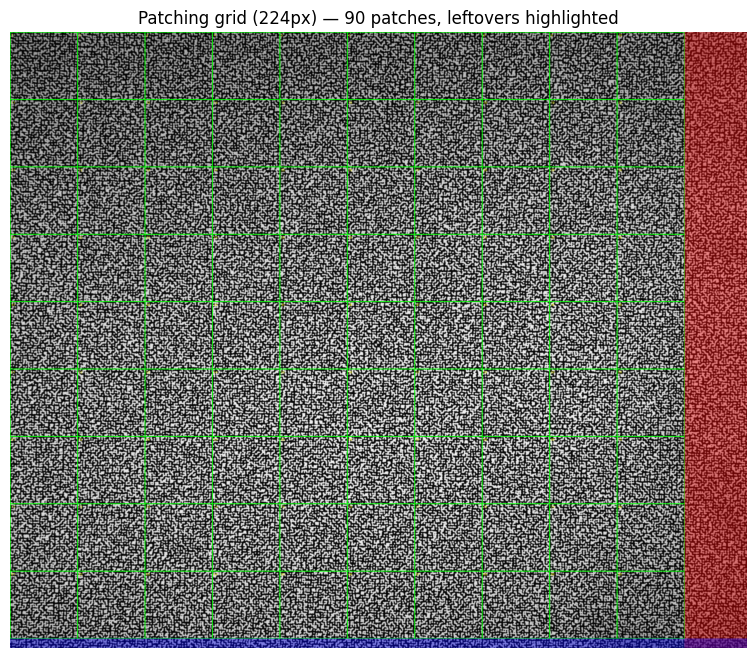

In [109]:
import os
import tifffile
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

# ==== CONFIG ====
tiff_path = "Dissertation/haze/0cm_0185.tiff"  # TIFF path
PATCH_SIZE = 224
STRIDE = 224

# ==== READ IMAGE ====
arr = tifffile.imread(tiff_path)
norm_arr = ((arr - arr.min()) / (np.ptp(arr) + 1e-8) * 255).astype(np.uint8)
img = Image.fromarray(norm_arr).convert("RGB")
w, h = img.size

# ==== DRAW ====
draw = ImageDraw.Draw(img)
try:
    font = ImageFont.truetype("arial.ttf", 20)  # may need a different font if not available
except:
    font = ImageFont.load_default()

num_h = ((h - PATCH_SIZE) // STRIDE) + 1
num_w = ((w - PATCH_SIZE) // STRIDE) + 1

patch_id = 1
for top in range(0, h - PATCH_SIZE + 1, STRIDE):
    for left in range(0, w - PATCH_SIZE + 1, STRIDE):
        # Draw rectangle for patch
        draw.rectangle(
            [(left, top), (left + PATCH_SIZE, top + PATCH_SIZE)],
            outline=(0, 255, 0),
            width=2
        )
        # Draw patch number at the top-left corner of the patch
        draw.text((left + 5, top + 5), str(patch_id), fill=(255, 255, 0), font=font)
        patch_id += 1

# ==== HIGHLIGHT UNUSED AREA ====
img = img.convert("RGBA")

# Right leftover
right_leftover = w - (num_w * PATCH_SIZE)
if right_leftover > 0:
    overlay = Image.new("RGBA", img.size, (0, 0, 0, 0))
    overlay_draw = ImageDraw.Draw(overlay)
    overlay_draw.rectangle(
        [(num_w * PATCH_SIZE, 0), (w, h)],
        fill=(255, 0, 0, 100)  # red transparent
    )
    img = Image.alpha_composite(img, overlay)

# Bottom leftover
bottom_leftover = h - (num_h * PATCH_SIZE)
if bottom_leftover > 0:
    overlay = Image.new("RGBA", img.size, (0, 0, 0, 0))
    overlay_draw = ImageDraw.Draw(overlay)
    overlay_draw.rectangle(
        [(0, num_h * PATCH_SIZE), (w, h)],
        fill=(0, 0, 255, 100)  # blue transparent
    )
    img = Image.alpha_composite(img, overlay)

# ==== SHOW RESULT ====
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.axis("off")
plt.title(f"Patching grid ({PATCH_SIZE}px) — {patch_id-1} patches, leftovers highlighted")
plt.show()


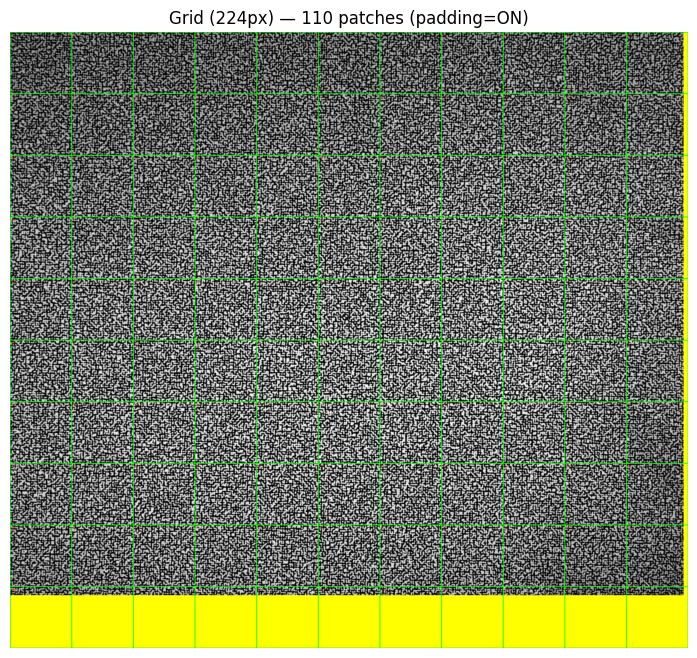

In [110]:
import os
import tifffile
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import math

# ==== CONFIG ====
tiff_path = "Dissertation/haze/0cm_0185.tiff"
PATCH_SIZE = 224
STRIDE = 224
USE_PADDING = True

# ==== READ IMAGE ====
arr = tifffile.imread(tiff_path)
norm_arr = ((arr - arr.min()) / (np.ptp(arr) + 1e-8) * 255).astype(np.uint8)
img = Image.fromarray(norm_arr).convert("RGB")
w, h = img.size

# ===== Optional Padding =====
if USE_PADDING:
    pad_w = (math.ceil(w / PATCH_SIZE) * PATCH_SIZE) - w
    pad_h = (math.ceil(h / PATCH_SIZE) * PATCH_SIZE) - h
    if pad_w > 0 or pad_h > 0:
        padded_img = Image.new("RGB", (w + pad_w, h + pad_h), color=(255, 255, 0))  # yellow for padding
        padded_img.paste(img, (0, 0))
        img = padded_img
        w, h = img.size

# ==== DRAW ====
draw = ImageDraw.Draw(img)
try:
    font = ImageFont.truetype("arial.ttf", 20)
except:
    font = ImageFont.load_default()

num_h = ((h - PATCH_SIZE) // STRIDE) + 1
num_w = ((w - PATCH_SIZE) // STRIDE) + 1

patch_id = 1
for top in range(0, h - PATCH_SIZE + 1, STRIDE):
    for left in range(0, w - PATCH_SIZE + 1, STRIDE):
        draw.rectangle([(left, top), (left + PATCH_SIZE, top + PATCH_SIZE)], outline=(0, 255, 0), width=2)
        draw.text((left + 5, top + 5), str(patch_id), fill=(255, 0, 0), font=font)
        patch_id += 1

# Highlight leftover if not padded
if not USE_PADDING:
    img = img.convert("RGBA")
    right_leftover = w - (num_w * PATCH_SIZE)
    if right_leftover > 0:
        overlay = Image.new("RGBA", img.size, (0, 0, 0, 0))
        ImageDraw.Draw(overlay).rectangle([(num_w * PATCH_SIZE, 0), (w, h)], fill=(255, 0, 0, 100))
        img = Image.alpha_composite(img, overlay)

    bottom_leftover = h - (num_h * PATCH_SIZE)
    if bottom_leftover > 0:
        overlay = Image.new("RGBA", img.size, (0, 0, 0, 0))
        ImageDraw.Draw(overlay).rectangle([(0, num_h * PATCH_SIZE), (w, h)], fill=(0, 0, 255, 100))
        img = Image.alpha_composite(img, overlay)

# ==== SHOW RESULT ====
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.axis("off")
plt.title(f"Grid ({PATCH_SIZE}px) — {patch_id-1} patches (padding={'ON' if USE_PADDING else 'OFF'})")
plt.show()


## Orginal Label checks

In [21]:
import pandas as pd
print("Train csv rows:", len(pd.read_csv("PrecomputedPatches/train.csv")))
print("Val   csv rows:", len(pd.read_csv("PrecomputedPatches/val.csv")))
print("Test  csv rows:", len(pd.read_csv("PrecomputedPatches/test.csv")))

# peek at one batch
images, labels = next(iter(train_loader))
print("Batch shapes:", images.shape, labels.shape)

# peek at a test sample with path
img, lbl, orig = next(iter(test_loader_analysis))
print("Test batch shapes:", img.shape, "label example:", lbl[0].item(), "orig_tiff example:", orig[0])


Train csv rows: 227227
Val   csv rows: 59400
Test  csv rows: 59400
Batch shapes: torch.Size([32, 3, 224, 224]) torch.Size([32])
Test batch shapes: torch.Size([32, 3, 224, 224]) label example: 1 orig_tiff example: Dissertation/nonhaze/noheat_0080.tiff


## Error correction

In [32]:
import pandas as pd

train_df = pd.read_csv("PrecomputedPatches1/train.csv")
val_df   = pd.read_csv("PrecomputedPatches1/val.csv")
test_df  = pd.read_csv("PrecomputedPatches1/test.csv")

def intersection_count(a, b, col="original_tiff"):
    s1, s2 = set(a[col].unique()), set(b[col].unique())
    inter = s1.intersection(s2)
    return len(inter), len(s1), len(s2), list(inter)[:10]

print("train/val orig_tiff overlap:", intersection_count(train_df, val_df))
print("train/test orig_tiff overlap:", intersection_count(train_df, test_df))
print("val/test orig_tiff overlap:", intersection_count(val_df, test_df))

# If any overlaps > 0: that's almost certainly leakage and must be fixed.


train/val orig_tiff overlap: (0, 140, 30, [])
train/test orig_tiff overlap: (0, 140, 30, [])
val/test orig_tiff overlap: (0, 30, 30, [])


In [33]:
def duplicate_info(df, col="patch_path"):
    total = len(df)
    unique = df[col].nunique()
    return total, unique, total-unique

print("Train dup:", duplicate_info(train_df))
print("Val dup:", duplicate_info(val_df))
print("Train ∩ Val patch_path duplicates:", len(set(train_df['patch_path']).intersection(set(val_df['patch_path']))))


Train dup: (12629, 12629, 0)
Val dup: (3300, 3300, 0)
Train ∩ Val patch_path duplicates: 0


In [34]:
print("Train class counts:\n", train_df['label'].value_counts())
print("Val class counts:\n", val_df['label'].value_counts())

# Check how many TIFFs are pure-labeled (all patches same label) vs mixed
def per_tiff_label_stats(df):
    g = df.groupby("original_tiff")['label'].nunique()
    stats = g.value_counts().to_dict()
    return stats, g[g>1].shape[0]  # how many TIFFs have >1 label
print("Per-tiff label stats (train):", per_tiff_label_stats(train_df))


Train class counts:
 label
0    6409
1    6220
Name: count, dtype: int64
Val class counts:
 label
1    1760
0    1540
Name: count, dtype: int64
Per-tiff label stats (train): ({1: 140}, 0)


In [35]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import random

def show_random_patch_pair(train_df, val_df, n=3):
    # find a tiff present in both (if any)
    common = set(train_df['original_tiff']).intersection(set(val_df['original_tiff']))
    if not common:
        print("No common TIFFs between train and val.")
        return
    tiff = random.choice(list(common))
    t_patches = train_df[train_df['original_tiff']==tiff]['patch_path'].values
    v_patches = val_df[val_df['original_tiff']==tiff]['patch_path'].values
    print("Example TIFF with overlap:", tiff)
    for i in range(min(n, len(t_patches), len(v_patches))):
        fig, axs = plt.subplots(1,2, figsize=(6,3))
        axs[0].imshow(np.array(Image.open(t_patches[i]).convert("L")))
        axs[0].set_title("train")
        axs[1].imshow(np.array(Image.open(v_patches[i]).convert("L")))
        axs[1].set_title("val")
        plt.show()

show_random_patch_pair(train_df, val_df, n=2)


No common TIFFs between train and val.


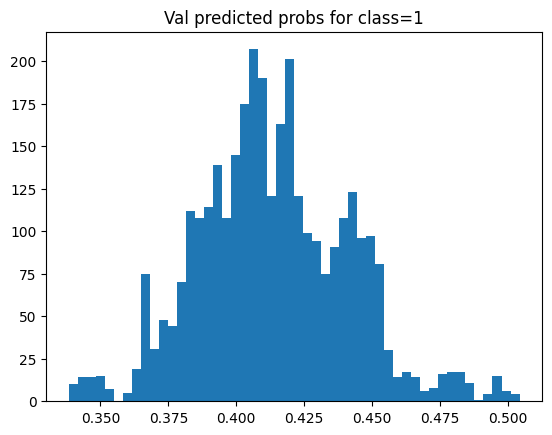

Mean prob: 0.41365337 std: 0.027721567


In [36]:
import numpy as np
import torch
from tqdm import tqdm

def collect_probs(model, dataloader, device):
    model.eval()
    probs = []
    labels = []
    with torch.no_grad():
        for batch in dataloader:
            # adjust to accept both (img,label) and (img,label,path)
            if len(batch) == 2:
                images, lbls = batch
            else:
                images, lbls, _ = batch
            images = images.to(device)
            out = model(images)
            p = torch.softmax(out, dim=1)[:,1].cpu().numpy()
            probs.extend(p)
            labels.extend(lbls.numpy())
    probs = np.array(probs)
    labels = np.array(labels)
    return probs, labels

probs, labels = collect_probs(model, val_loader, device)
import matplotlib.pyplot as plt
plt.hist(probs, bins=50)
plt.title("Val predicted probs for class=1")
plt.show()
print("Mean prob:", probs.mean(), "std:", probs.std())


In [37]:
print("Train transform:", train_loader.dataset.transform)
print("Val transform:", val_loader.dataset.transform)
print("Test transform:", test_loader.dataset.transform)


Train transform: Compose(
    Grayscale(num_output_channels=3)
    RandomResizedCrop(size=(224, 224), scale=(0.8, 1.0), ratio=(0.75, 1.3333), interpolation=bilinear, antialias=True)
    RandomHorizontalFlip(p=0.5)
    RandomVerticalFlip(p=0.5)
    RandomRotation(degrees=[-15.0, 15.0], interpolation=nearest, expand=False, fill=0)
    ColorJitter(brightness=(0.9, 1.1), contrast=(0.9, 1.1), saturation=None, hue=None)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    RandomErasing(p=0.25, scale=(0.02, 0.15), ratio=(0.3, 3.3), value=0, inplace=False)
)
Val transform: Compose(
    Grayscale(num_output_channels=3)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


AttributeError: 'DatasetWithoutPath' object has no attribute 'transform'

In [81]:
for name, param in model.named_parameters():
    if param.requires_grad and param.grad is not None:
        pass
# print a few grads after a training step
# run a tiny train step, then check grad norms
images, labels = next(iter(train_loader))
images = images.to(device); labels = labels.to(device)
model.train()
optimizer.zero_grad()
output = model(images)
loss = criterion(output, labels)
loss.backward()
print("Example grad for fc weight:", model.fc[1].weight.grad.norm().item())


Example grad for fc weight: 4.257229328155518


##  ResNet18 Model for Grayscale, Training & Evaluation Functions

In [54]:
def get_model(num_classes=2):
    model = resnet18(weights=ResNet18_Weights.DEFAULT)
    
    # New classifier head
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(model.fc.in_features, num_classes)
    )
    
    return model.to(device)

model = get_model()

criterion = nn.CrossEntropyLoss()

# ==== FREEZE backbone initially ====
for param in model.parameters():
    param.requires_grad = False
for param in model.fc.parameters():
    param.requires_grad = True

# Separate parameter groups: classifier (higher LR), backbone (lower LR)
optimizer = optim.Adam([
    {"params": model.fc.parameters(), "lr": 1e-4},     # classifier
    {"params": [p for n, p in model.named_parameters() if "fc" not in n], "lr": 1e-5}  # backbone
], weight_decay=1e-4)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.5)

def train_one_epoch(model, dataloader, criterion, optimizer, device):
    model.train()
    running_loss = 0
    all_preds, all_labels = [], []

    for images, labels in tqdm(dataloader, desc="Training"):
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        preds = outputs.argmax(dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    acc = accuracy_score(all_labels, all_preds)
    return running_loss / len(dataloader), acc

def evaluate(model, dataloader, criterion, device):
    model.eval()
    val_loss = 0
    all_preds, all_labels = [], []

    with torch.no_grad():
        for images, labels in tqdm(dataloader, desc="Validation"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            val_loss += loss.item()
            preds = outputs.argmax(dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    acc = accuracy_score(all_labels, all_preds)
    return val_loss / len(dataloader), acc

num_epochs = 15
best_val_acc = 0
save_path = "best_model.pth"

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")

    # Gradual unfreezing after a few epochs
    if epoch == 3:
        print("Unfreezing last ResNet block (layer4)...")
        for name, param in model.named_parameters():
            if "layer4" in name:
                param.requires_grad = True
    if epoch == 6:
        print("Unfreezing all layers...")
        for param in model.parameters():
            param.requires_grad = True

    total_sum_before = sum(p.data.sum().item() for p in model.parameters())
    print(f"Parameters sum before training: {total_sum_before:.6f}")

    train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer, device)

    total_sum_after = sum(p.data.sum().item() for p in model.parameters())
    print(f"Parameters sum after training: {total_sum_after:.6f}")

    val_loss, val_acc = evaluate(model, val_loader, criterion, device)
    scheduler.step(val_loss)

    current_lr = optimizer.param_groups[0]['lr']
    print(f"Current LR: {current_lr:.6e}")

    print(f"Train Loss: {train_loss:.4f} | Acc: {train_acc:.4f}")
    print(f"Val   Loss: {val_loss:.4f} | Acc: {val_acc:.4f}")

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), save_path)
        print(f"✓ Best model saved at epoch {epoch+1}")




Epoch 1/15
Parameters sum before training: -12705.060217


Training: 100%|█████████████████████████████| 1580/1580 [01:03<00:00, 24.71it/s]


Parameters sum after training: -12705.060110


Validation: 100%|█████████████████████████████| 375/375 [00:14<00:00, 25.46it/s]


Current LR: 1.000000e-04
Train Loss: 0.7577 | Acc: 0.5025
Val   Loss: 0.7028 | Acc: 0.4971
✓ Best model saved at epoch 1

Epoch 2/15
Parameters sum before training: -12705.060110


Training: 100%|█████████████████████████████| 1580/1580 [01:03<00:00, 24.71it/s]


Parameters sum after training: -12705.059995


Validation: 100%|█████████████████████████████| 375/375 [00:14<00:00, 25.42it/s]


Current LR: 1.000000e-04
Train Loss: 0.7125 | Acc: 0.5000
Val   Loss: 0.6932 | Acc: 0.5149
✓ Best model saved at epoch 2

Epoch 3/15
Parameters sum before training: -12705.059995


Training: 100%|█████████████████████████████| 1580/1580 [01:04<00:00, 24.64it/s]


Parameters sum after training: -12705.059880


Validation: 100%|█████████████████████████████| 375/375 [00:14<00:00, 25.85it/s]


Current LR: 1.000000e-04
Train Loss: 0.6997 | Acc: 0.5033
Val   Loss: 0.6932 | Acc: 0.5061

Epoch 4/15
Unfreezing last ResNet block (layer4)...
Parameters sum before training: -12705.059880


Training: 100%|█████████████████████████████| 1580/1580 [01:16<00:00, 20.69it/s]


Parameters sum after training: -12597.095574


Validation: 100%|█████████████████████████████| 375/375 [00:14<00:00, 26.21it/s]


Current LR: 1.000000e-04
Train Loss: 0.6973 | Acc: 0.5043
Val   Loss: 0.7066 | Acc: 0.4676

Epoch 5/15
Parameters sum before training: -12597.095574


Training: 100%|█████████████████████████████| 1580/1580 [01:16<00:00, 20.72it/s]


Parameters sum after training: -12464.267971


Validation: 100%|█████████████████████████████| 375/375 [00:14<00:00, 26.19it/s]


Current LR: 1.000000e-04
Train Loss: 0.6953 | Acc: 0.5072
Val   Loss: 0.6980 | Acc: 0.4851

Epoch 6/15
Parameters sum before training: -12464.267971


Training: 100%|█████████████████████████████| 1580/1580 [01:16<00:00, 20.67it/s]


Parameters sum after training: -12370.353070


Validation: 100%|█████████████████████████████| 375/375 [00:14<00:00, 26.14it/s]


Current LR: 5.000000e-05
Train Loss: 0.6940 | Acc: 0.5182
Val   Loss: 0.6936 | Acc: 0.4974

Epoch 7/15
Unfreezing all layers...
Parameters sum before training: -12370.353070


Training: 100%|█████████████████████████████| 1580/1580 [02:34<00:00, 10.25it/s]


Parameters sum after training: -12310.309156


Validation: 100%|█████████████████████████████| 375/375 [00:14<00:00, 25.39it/s]


Current LR: 5.000000e-05
Train Loss: 0.6904 | Acc: 0.5297
Val   Loss: 0.7003 | Acc: 0.4937

Epoch 8/15
Parameters sum before training: -12310.309156


Training: 100%|█████████████████████████████| 1580/1580 [02:34<00:00, 10.23it/s]


Parameters sum after training: -12260.617531


Validation: 100%|█████████████████████████████| 375/375 [00:14<00:00, 25.33it/s]


Current LR: 5.000000e-05
Train Loss: 0.6840 | Acc: 0.5515
Val   Loss: 0.7013 | Acc: 0.5003

Epoch 9/15
Parameters sum before training: -12260.617531


Training: 100%|█████████████████████████████| 1580/1580 [02:34<00:00, 10.22it/s]


Parameters sum after training: -12218.785951


Validation: 100%|█████████████████████████████| 375/375 [00:14<00:00, 25.24it/s]


Current LR: 5.000000e-05
Train Loss: 0.6763 | Acc: 0.5734
Val   Loss: 0.7036 | Acc: 0.5047

Epoch 10/15
Parameters sum before training: -12218.785951


Training: 100%|█████████████████████████████| 1580/1580 [02:34<00:00, 10.22it/s]


Parameters sum after training: -12199.537104


Validation: 100%|█████████████████████████████| 375/375 [00:14<00:00, 25.01it/s]


Current LR: 2.500000e-05
Train Loss: 0.6627 | Acc: 0.6013
Val   Loss: 0.7170 | Acc: 0.5069

Epoch 11/15
Parameters sum before training: -12199.537104


Training: 100%|█████████████████████████████| 1580/1580 [02:34<00:00, 10.23it/s]


Parameters sum after training: -12189.248760


Validation: 100%|█████████████████████████████| 375/375 [00:15<00:00, 24.88it/s]


Current LR: 2.500000e-05
Train Loss: 0.6440 | Acc: 0.6278
Val   Loss: 0.7245 | Acc: 0.5064

Epoch 12/15
Parameters sum before training: -12189.248760


Training:  72%|████████████████████▊        | 1132/1580 [01:50<00:43, 10.24it/s]


KeyboardInterrupt: 

## Training Loop with Scheduler

In [47]:

num_epochs = 15
best_val_acc = 0
save_path = "best_model.pth"

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")

    # Print sum of model parameters before training
    total_sum_before = sum(p.data.sum().item() for p in model.parameters())
    print(f"Parameters sum before training: {total_sum_before:.6f}")

    # Train for one epoch
    train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer, device)

    # Print sum of model parameters after training
    total_sum_after = sum(p.data.sum().item() for p in model.parameters())
    print(f"Parameters sum after training: {total_sum_after:.6f}")

    # Evaluate on validation set
    val_loss, val_acc = evaluate(model, val_loader, criterion, device)

    # Step scheduler using validation loss
    scheduler.step(val_loss)

    # Print current learning rate
    current_lr = optimizer.param_groups[0]['lr']
    print(f"Current LR: {current_lr:.6e}")

    print(f"Train Loss: {train_loss:.4f} | Acc: {train_acc:.4f}")
    print(f"Val   Loss: {val_loss:.4f} | Acc: {val_acc:.4f}")

    # Save best model checkpoint
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), save_path)
        print(f"✓ Best model saved at epoch {epoch+1}")



Epoch 1/15
Parameters sum before training: -12703.650853


Training: 100%|█████████████████████████████| 1580/1580 [02:33<00:00, 10.26it/s]


Parameters sum after training: -11870.739773


Validation: 100%|█████████████████████████████| 375/375 [00:15<00:00, 24.63it/s]


Current LR: 1.000000e-04
Train Loss: 0.7319 | Acc: 0.5023
Val   Loss: 0.6926 | Acc: 0.5072
✓ Best model saved at epoch 1

Epoch 2/15
Parameters sum before training: -11870.739773


Training: 100%|█████████████████████████████| 1580/1580 [02:34<00:00, 10.23it/s]


Parameters sum after training: -10342.135533


Validation: 100%|█████████████████████████████| 375/375 [00:15<00:00, 24.63it/s]


Current LR: 1.000000e-04
Train Loss: 0.7023 | Acc: 0.4992
Val   Loss: 0.6910 | Acc: 0.5318
✓ Best model saved at epoch 2

Epoch 3/15
Parameters sum before training: -10342.135533


Training: 100%|█████████████████████████████| 1580/1580 [02:34<00:00, 10.24it/s]


Parameters sum after training: -7998.077144


Validation: 100%|█████████████████████████████| 375/375 [00:15<00:00, 24.54it/s]


Current LR: 1.000000e-04
Train Loss: 0.6972 | Acc: 0.5079
Val   Loss: 0.6940 | Acc: 0.5009

Epoch 4/15
Parameters sum before training: -7998.077144


Training: 100%|█████████████████████████████| 1580/1580 [02:34<00:00, 10.22it/s]


Parameters sum after training: -5356.227000


Validation: 100%|█████████████████████████████| 375/375 [00:15<00:00, 24.57it/s]


Current LR: 1.000000e-04
Train Loss: 0.6903 | Acc: 0.5375
Val   Loss: 0.7747 | Acc: 0.4653

Epoch 5/15
Parameters sum before training: -5356.227000


Training: 100%|█████████████████████████████| 1580/1580 [02:34<00:00, 10.23it/s]


Parameters sum after training: -3884.150010


Validation: 100%|█████████████████████████████| 375/375 [00:15<00:00, 24.60it/s]


Current LR: 1.000000e-04
Train Loss: 0.6658 | Acc: 0.5948
Val   Loss: 0.7336 | Acc: 0.4871

Epoch 6/15
Parameters sum before training: -3884.150010


Training:  80%|███████████████████████▎     | 1269/1580 [02:03<00:30, 10.23it/s]


KeyboardInterrupt: 

In [11]:
for path, label in train_data[:10]:
    print(label, path)


0 Dissertation/haze/0cm_0017.tiff
1 Dissertation/nonhaze/noheat_0587.tiff
1 Dissertation/nonhaze/noheat_0038.tiff
1 Dissertation/nonhaze/noheat_0517.tiff
0 Dissertation/haze/100cm_0129.tiff
0 Dissertation/haze/100cm_0158.tiff
1 Dissertation/nonhaze/noheat_0042.tiff
1 Dissertation/nonhaze/noheat_0699.tiff
0 Dissertation/haze/120cm_0251.tiff
0 Dissertation/haze/100cm_0025.tiff


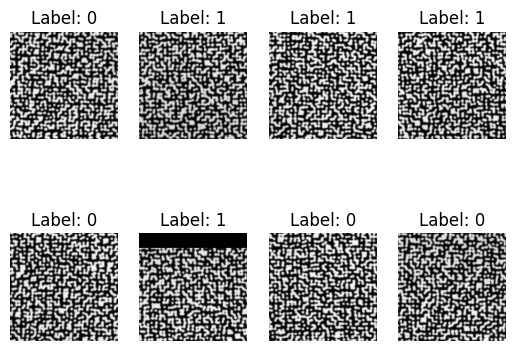

In [41]:
import matplotlib.pyplot as plt
images, labels = next(iter(train_loader))
for i in range(8):
    plt.subplot(2, 4, i+1)
    plt.imshow(images[i][0], cmap="gray")  # or remove [0] if RGB
    plt.title(f"Label: {labels[i].item()}")
    plt.axis("off")
plt.show()


## ROC curve + Precision-Recall

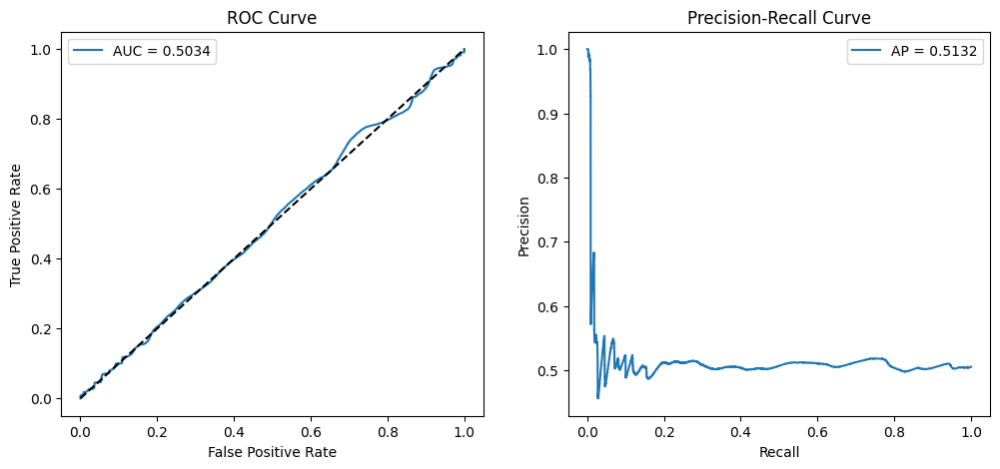

In [103]:
from sklearn.metrics import roc_curve, roc_auc_score, precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt
import torch

# -----------------------------------------------------------
# Compute ROC and Precision-Recall curves for a given loader
# -----------------------------------------------------------
def compute_metrics(model, dataloader, device):
    model.eval()
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)[:, 1]  # Probability for class "1"

            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    return np.array(all_labels), np.array(all_probs)


# -----------------------------------------------------------
# Plot ROC curve and Precision-Recall curve
# -----------------------------------------------------------
def plot_roc_pr_curves(labels, probs):
    # ROC Curve
    fpr, tpr, _ = roc_curve(labels, probs)
    auc_score = roc_auc_score(labels, probs)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(fpr, tpr, label=f"AUC = {auc_score:.4f}")
    plt.plot([0, 1], [0, 1], "k--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve")
    plt.legend()

    # Precision-Recall Curve
    precision, recall, _ = precision_recall_curve(labels, probs)
    ap_score = average_precision_score(labels, probs)

    plt.subplot(1, 2, 2)
    plt.plot(recall, precision, label=f"AP = {ap_score:.4f}")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision-Recall Curve")
    plt.legend()

    plt.show()


# -----------------------------------------------------------
# Example usage after training
# -----------------------------------------------------------
labels, probs = compute_metrics(model, val_loader, device)
plot_roc_pr_curves(labels, probs)


In [64]:
import torch
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu") 

# 1. Reconstruct the same architecture
model = get_model(num_classes=2)
model.to(device)

# 2. Load the weights
model.load_state_dict(torch.load("best_model.pth", map_location=device))

def evaluate_on_test_patches(model, test_loader, class_names, device):
    model.eval()
    all_preds = []
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = torch.argmax(probs, dim=1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    acc = np.mean(np.array(all_preds) == np.array(all_labels))
    print(f"\nTest Patch Accuracy: {acc:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=class_names))

    # Confusion Matrix
    cm = confusion_matrix(all_labels, all_preds)
    df_cm = pd.DataFrame(cm, index=class_names, columns=class_names)
    plt.figure(figsize=(6, 5))
    sns.heatmap(df_cm, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix (Patches)")
    plt.ylabel("Actual")
    plt.xlabel("Predicted")
    plt.tight_layout()
    plt.show()

    return all_preds, all_labels, all_probs



Test Patch Accuracy: 0.9659

Classification Report:
              precision    recall  f1-score   support

     nonhaze       0.97      0.97      0.97     25380
        haze       0.97      0.96      0.96     23220

    accuracy                           0.97     48600
   macro avg       0.97      0.97      0.97     48600
weighted avg       0.97      0.97      0.97     48600



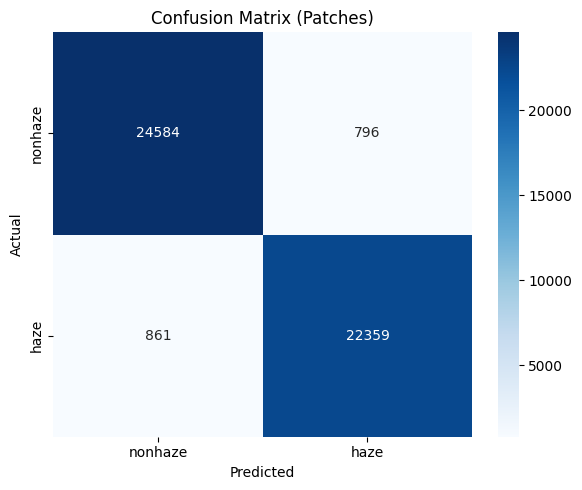

In [65]:
class_names = ['nonhaze', 'haze']
all_preds, all_labels, all_probs = evaluate_on_test_patches(model, test_loader, class_names, device)


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import torch.nn.functional as F
import numpy as np
from collections import defaultdict

def evaluate_whole_images(model, dataloader, device):
    model.eval()
    image_scores = defaultdict(list)
    image_labels = {}

    with torch.no_grad():
        for images, labels, paths in dataloader:  # paths = original tiff paths
            images = images.to(device)
            outputs = model(images)
            probs = F.softmax(outputs, dim=1)  # [batch, num_classes]
            for prob, label, path in zip(probs.cpu().numpy(), labels.numpy(), paths):
                img_name = os.path.basename(path)
                image_scores[img_name].append(prob)
                image_labels[img_name] = label

    # Aggregate patch probs per image
    y_true, y_pred, severity_scores = [], [], []
    for img_name, probs_list in image_scores.items():
        avg_prob = np.mean(probs_list, axis=0)  # mean over patches
        pred_class = np.argmax(avg_prob)
        y_true.append(image_labels[img_name])
        y_pred.append(pred_class)
        severity_scores.append(avg_prob[1])  # prob of class=1 (your "severity")

    # Metrics
    acc = accuracy_score(y_true, y_pred)
    cm = confusion_matrix(y_true, y_pred)
    report = classification_report(y_true, y_pred, digits=4)

    print(f"Image-level accuracy: {acc:.4f}")
    print("Confusion Matrix:\n", cm)
    print("Classification Report:\n", report)

    return y_true, y_pred, severity_scores

# Example usage:
y_true, y_pred, severities = evaluate_whole_images(model, test_loader_analysis, device)
plt.hist(severities, bins=20)
plt.xlabel("Predicted severity score (prob of class=1)")
plt.ylabel("Number of images")
plt.title("Severity score distribution")
plt.show()

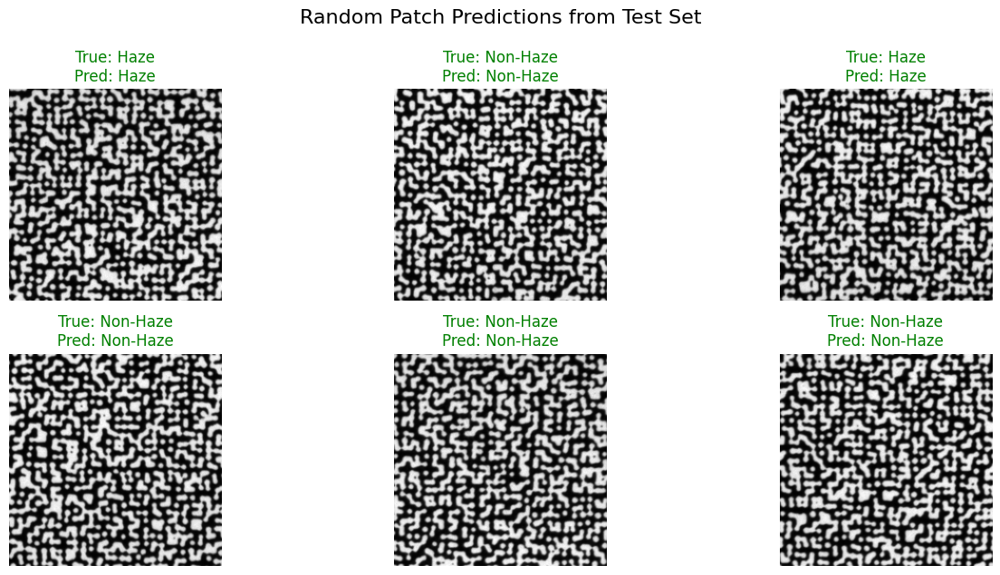

In [66]:
# Use patches directly from test_loader.dataset
sample_indices = random.sample(range(len(test_loader.dataset)), 6)
label_map = {0: "Haze", 1: "Non-Haze"}
plt.figure(figsize=(14, 6))

for i, idx in enumerate(sample_indices):
    patch, label = test_loader.dataset[idx]
    input_tensor = patch.unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(input_tensor)
        pred = output.argmax(dim=1).item()

    # Convert for visualization
    np_img = tensor_to_np(input_tensor)

    # Label and title
    color = "green" if pred == label else "red"
    title = f"True: {label_map[label]}\nPred: {label_map[pred]}"

    # Plot
    plt.subplot(2, 3, i + 1)
    plt.imshow(np_img)
    plt.title(title, color=color)
    plt.axis('off')

plt.tight_layout()
plt.suptitle("Random Patch Predictions from Test Set", fontsize=16, y=1.05)
plt.show()


In [67]:
import torch
import torch.nn.functional as F
import numpy as np
import cv2
import matplotlib.pyplot as plt
from torchvision.models import resnet18
from torchvision.models import ResNet18_Weights
from torchvision import transforms
from PIL import Image
import os
import random 

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#  Load model
model = get_model(num_classes=2).to(device)
model.load_state_dict(torch.load("best_model.pth", map_location=device))
model.eval()

# -------------------- GradCAM Class --------------------
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model.eval()
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        target_layer.register_forward_hook(self.forward_hook)
        target_layer.register_full_backward_hook(self.backward_hook)

    def forward_hook(self, module, input, output):
        self.activations = output

    def backward_hook(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]

    def generate_cam(self, input_tensor, target_class=None):
        self.model.zero_grad()
        output = self.model(input_tensor)

        if target_class is None:
            target_class = output.argmax(dim=1).item()

        loss = output[0, target_class]
        loss.backward()

        gradients = self.gradients[0].cpu().detach().numpy()
        activations = self.activations[0].cpu().detach().numpy()

        weights = gradients.mean(axis=(1, 2))
        cam = np.zeros(activations.shape[1:], dtype=np.float32)

        for i, w in enumerate(weights):
            cam += w * activations[i]

        cam = np.maximum(cam, 0)
        cam -= cam.min()
        cam /= cam.max() + 1e-8
        return cam

    def generate_smoothgrad_cam(self, input_tensor, target_class=None, num_samples=25, noise_level=0.1):
        cams = []
        for _ in range(num_samples):
            noise = noise_level * torch.randn_like(input_tensor).to(input_tensor.device)
            noisy_input = torch.clamp(input_tensor + noise, 0, 1)
            cam = self.generate_cam(noisy_input, target_class)
            cams.append(cam)
        return np.mean(cams, axis=0)


# -------------------- Utilities --------------------
def tensor_to_np(img_tensor):
    img = img_tensor.squeeze().cpu().detach().numpy()
    if img.ndim == 3:
        img = img[0]  # from [1, H, W]
    img = (img - img.min()) / (img.max() - img.min() + 1e-8)
    img = (img * 255).astype(np.uint8)
    img = np.stack([img] * 3, axis=-1)  # Convert grayscale to RGB for visualization
    return img


def overlay_cam_on_image(img_tensor, cam_map):
    img = tensor_to_np(img_tensor)
    cam_resized = cv2.resize(cam_map, (img.shape[1], img.shape[0]))
    heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(heatmap, 0.5, img, 0.5, 0)
    return overlay


# -------------------- Select Image from Test Data --------------------
def select_one_per_class(test_data, class_names):
    selected = {}
    for path, label in test_data:
        if label not in selected:
            selected[label] = path
        if len(selected) == len(class_names):
            break
    return selected


def tensor_to_pil_image(tensor):
    tensor = tensor.squeeze().cpu().clone()
    tensor = tensor * 0.5 + 0.5  # Unnormalize if normalized with [0.5]
    array = tensor.numpy()
    array = (array * 255).astype(np.uint8)
    return Image.fromarray(array)

def visualize_smoothgrad_per_class(model, data_input, transform=None, save_path=None, device='cuda', random_select=True):
    random.seed(75)
    model.eval()
    model.to(device)

    gradcam = GradCAM(model, model.layer4[-1])  # Ensure this layer is correct for your model

    label_names = {0: "Haze", 1: "Non-Haze"}
    selected = {}

    # Handle DataLoader (with or without path info)
    if isinstance(data_input, torch.utils.data.DataLoader):
        for batch in data_input:
            if len(batch) == 3:
                images, labels, paths = batch
            else:
                images, labels = batch
                paths = [f"[Index {i}]" for i in range(len(labels))]

            for i in range(images.size(0)):
                label = labels[i].item()
                if label not in selected:
                    selected[label] = (images[i].unsqueeze(0), paths[i])
                if len(selected) == len(label_names):
                    break
            if len(selected) == len(label_names):
                break
    else:
        # Input is list of (path, label)
        for path, label in data_input:
            if label not in selected:
                image = Image.open(path).convert('L')
                tensor = transform(image).unsqueeze(0).to(device)
                selected[label] = (tensor, path)
            if len(selected) == len(label_names):
                break

    if len(selected) < 2:
        print("Error: Could not find both classes (Haze and Non-Haze)")
        return

    plt.figure(figsize=(12, 6))

    for idx, (label, (tensor, path)) in enumerate(selected.items()):
        tensor = tensor.to(device)
        outputs = model(tensor)
        pred_class = outputs.argmax(dim=1).item()

        cam = gradcam.generate_smoothgrad_cam(tensor, pred_class, num_samples=40, noise_level=0.1)
        orig_img = tensor_to_np(tensor)
        heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
        overlay = overlay_cam_on_image(tensor, cam)

        true_class_name = label_names[label]
        pred_class_name = label_names[pred_class]

        print(f"[GRADCAM] True: {true_class_name}, Pred: {pred_class_name}, Path: {path}")

        # Plotting
        plt.subplot(2, 3, idx * 3 + 1)
        plt.imshow(orig_img, cmap='gray')
        plt.title(f"Original: {true_class_name}")
        plt.axis('off')

        plt.subplot(2, 3, idx * 3 + 2)
        plt.imshow(heatmap)
        plt.title("SmoothGrad-CAM")
        plt.axis('off')

        plt.subplot(2, 3, idx * 3 + 3)
        plt.imshow(overlay)
        plt.title(f"True: {true_class_name}\nPred: {pred_class_name}")
        plt.axis('off')

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
    plt.show()


[GRADCAM] True: Non-Haze, Pred: Non-Haze, Path: Dissertation/nonhaze/noheat_0069.tiff
[GRADCAM] True: Haze, Pred: Haze, Path: Dissertation/haze/120cm_0172.tiff


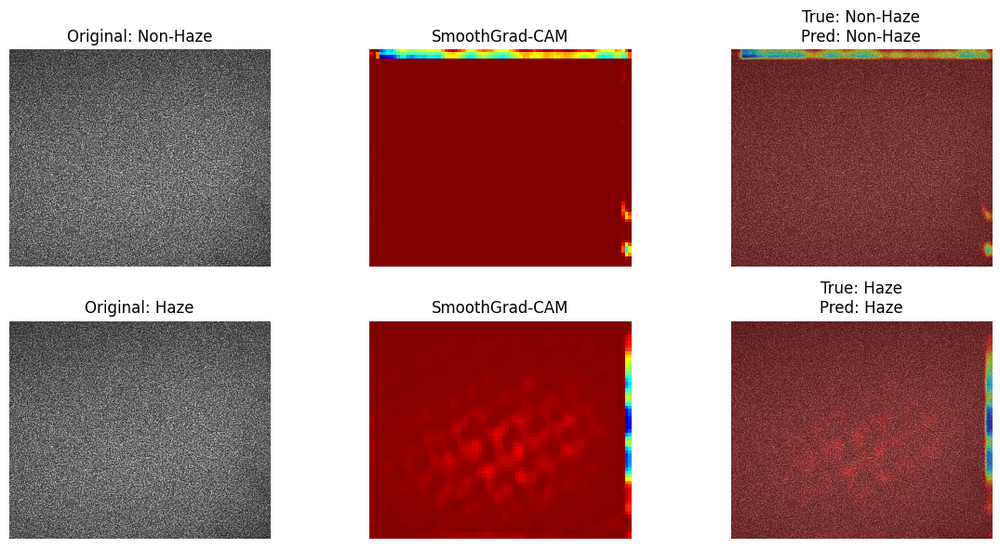

In [68]:
visualize_smoothgrad_per_class(model, test_data, transform=val_transform, save_path="fullimage_gradcam_output.png")


[GRADCAM] True: Non-Haze, Pred: Non-Haze, Path: Dissertation/nonhaze/noheat_0069.tiff
[GRADCAM] True: Haze, Pred: Haze, Path: Dissertation/haze/120cm_0172.tiff


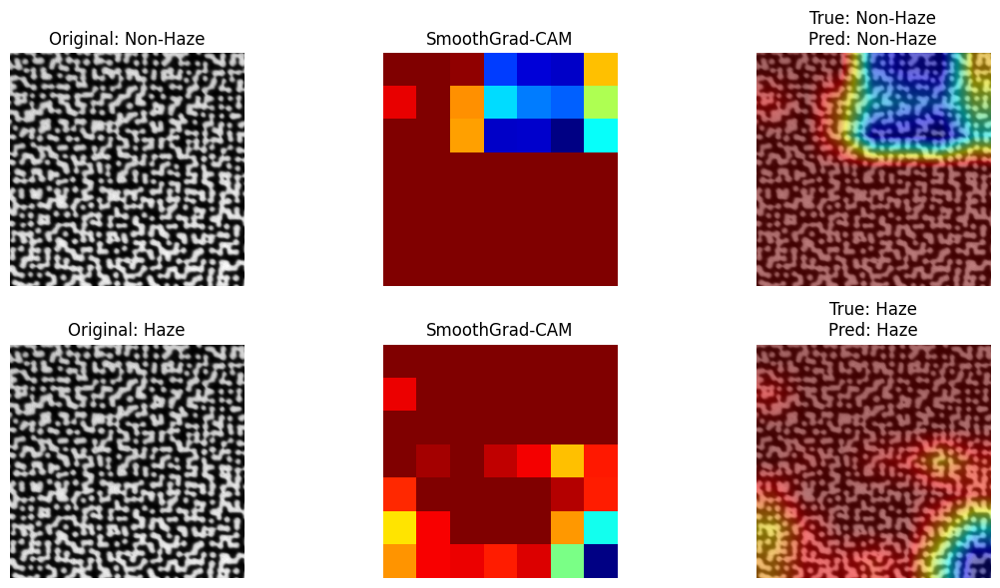

In [69]:
visualize_smoothgrad_per_class(model, test_loader_analysis, transform=val_transform, save_path="patch_gradcam_output.png")

In [70]:
def get_misclassified_samples(model, dataloader, device='cuda', limit=2):
    model.eval()
    misclassified = []

    with torch.no_grad():
        for batch in dataloader:
            if len(batch) == 3:
                images, labels, paths = batch
            else:
                images, labels = batch
                paths = [f"[Index {i}]" for i in range(len(labels))]

            images = images.to(device)
            outputs = model(images)
            preds = outputs.argmax(dim=1)

            for i in range(images.size(0)):
                true_label = labels[i].item()
                pred_label = preds[i].item()
                if true_label != pred_label:
                    misclassified.append((images[i].unsqueeze(0), true_label, pred_label, paths[i]))
                if len(misclassified) >= limit:
                    return misclassified
    return misclassified


def visualize_from_sample_tensors(samples, model, gradcam, label_names, device='cuda'):
    plt.figure(figsize=(12, 6))
    for idx, (tensor, true_label, pred_label, path) in enumerate(samples):
        tensor = tensor.to(device)

        cam = gradcam.generate_smoothgrad_cam(tensor, pred_label, num_samples=40, noise_level=0.1)
        orig_img = tensor_to_np(tensor)
        heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
        overlay = overlay_cam_on_image(tensor, cam)

        true_name = label_names[true_label]
        pred_name = label_names[pred_label]
        print(f"[MISCLASSIFIED] True: {true_name}, Pred: {pred_name}, Path: {path}")

        plt.subplot(2, 3, idx * 3 + 1)
        plt.imshow(orig_img, cmap='gray')
        plt.title("Original")
        plt.axis('off')

        plt.subplot(2, 3, idx * 3 + 2)
        plt.imshow(heatmap)
        plt.title("SmoothGrad-CAM")
        plt.axis('off')

        plt.subplot(2, 3, idx * 3 + 3)
        plt.imshow(overlay)
        plt.title(f"True: {true_name}\nPred: {pred_name}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()



[MISCLASSIFIED] True: Non-Haze, Pred: Haze, Path: Dissertation/nonhaze/noheat_0069.tiff
[MISCLASSIFIED] True: Non-Haze, Pred: Haze, Path: Dissertation/nonhaze/noheat_0625.tiff


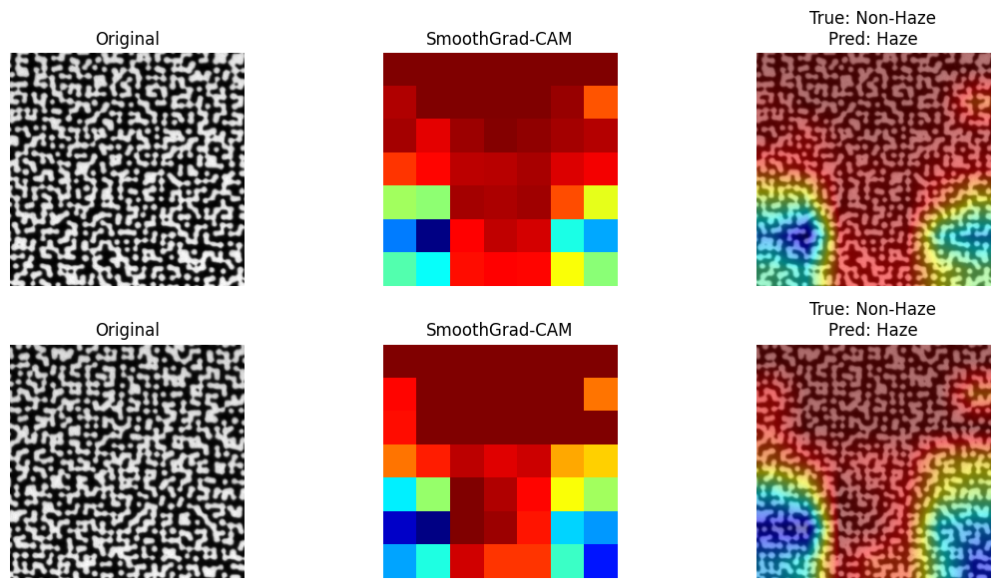

In [71]:
gradcam = GradCAM(model, model.layer4[-1])
label_names = {0: "Haze", 1: "Non-Haze"}

bad_samples = get_misclassified_samples(model, test_loader_analysis, device=device)

visualize_from_sample_tensors(bad_samples, model, gradcam, label_names, device='cuda')

In [72]:
import torch
import numpy as np
import tifffile
from PIL import Image
import matplotlib.pyplot as plt
import cv2

def gradcam_on_patched_tiff(tiff_path, model, gradcam, transform, device,
                            patch_size=224, stride=224, num_samples=40, noise_level=0.1, true_label=None):
    """
    Apply Grad-CAM on a full TIFF image by aggregating patch-level CAMs.

    Args:
        tiff_path (str): Path to the TIFF image
        model: Trained model
        gradcam: GradCAM object with generate_smoothgrad_cam()
        transform: Preprocessing transform
        device: 'cuda' or 'cpu'
        patch_size: Patch size
        stride: Patch stride
        num_samples: SmoothGrad samples
        noise_level: SmoothGrad noise level
        true_label: Optional, ground truth label for comparison
    """
    model.eval()
    model.to(device)

    label_names = {0: "Haze", 1: "Non-Haze"}

    # Load and normalize the TIFF image
    raw = tifffile.imread(tiff_path)
    norm_img = ((raw - raw.min()) / (np.ptp(raw) + 1e-8) * 255).astype(np.uint8)
    image = Image.fromarray(norm_img).convert("L")
    W, H = image.size

    # Prepare canvas for CAM aggregation
    cam_agg = np.zeros((H, W), dtype=np.float32)
    count_map = np.zeros((H, W), dtype=np.float32)

    preds = []

    # Process patches
    for top in range(0, H - patch_size + 1, stride):
        for left in range(0, W - patch_size + 1, stride):
            patch = image.crop((left, top, left + patch_size, top + patch_size))
            tensor = transform(patch).unsqueeze(0).to(device)

            with torch.no_grad():
                output = model(tensor)
                pred_class = output.argmax(dim=1).item()
                preds.append(pred_class)

            cam = gradcam.generate_smoothgrad_cam(
                tensor, target_class=pred_class,
                num_samples=num_samples, noise_level=noise_level
            )

            cam_resized = cv2.resize(cam, (patch_size, patch_size))
            cam_agg[top:top+patch_size, left:left+patch_size] += cam_resized
            count_map[top:top+patch_size, left:left+patch_size] += 1

    # Normalize CAM
    cam_final = cam_agg / (count_map + 1e-8)
    cam_final = np.clip(cam_final, 0, 1)

    # Determine overall prediction via majority voting
    majority_pred = max(set(preds), key=preds.count)
    pred_label_name = label_names[majority_pred]
    true_label_name = label_names[true_label] if true_label is not None else "Unknown"

    print(f"[GRADCAM PATCHED] True: {true_label_name}, Pred: {pred_label_name}, Path: {tiff_path}")

    # Generate overlay
    heatmap = cv2.applyColorMap(np.uint8(255 * cam_final), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    orig_resized = np.array(image.convert("RGB")).astype(np.uint8)
    overlay = 0.5 * heatmap + 0.5 * orig_resized
    overlay = overlay.astype(np.uint8)

    # Plotting
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(orig_resized, cmap="gray")
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(cam_final, cmap="jet")
    plt.title("SmoothGrad CAM Map")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title(f"Overlay\nTrue: {true_label_name}, Pred: {pred_label_name}")
    plt.axis("off")

    plt.tight_layout()
    plt.show()



[GRADCAM PATCHED] True: Non-Haze, Pred: Non-Haze, Path: Dissertation/nonhaze/noheat_0069.tiff


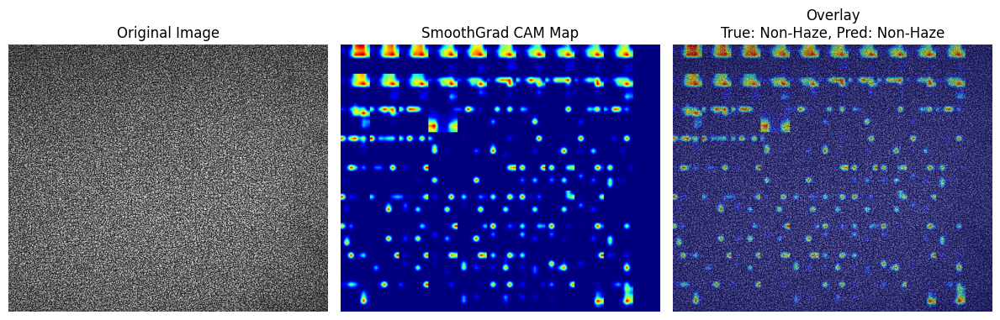

[GRADCAM PATCHED] True: Non-Haze, Pred: Non-Haze, Path: Dissertation/nonhaze/noheat_0625.tiff


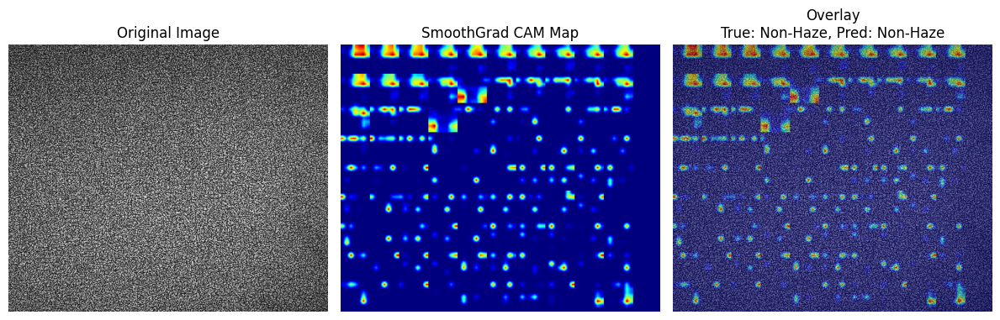

[GRADCAM PATCHED] True: Haze, Pred: Haze, Path: Dissertation/haze/120cm_0172.tiff


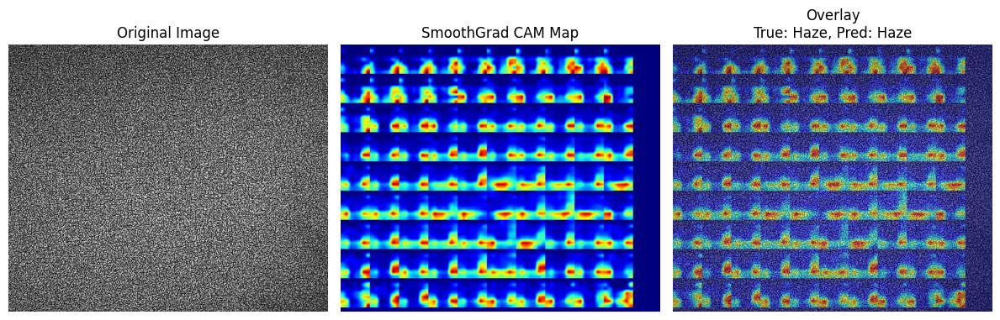

[GRADCAM PATCHED] True: Non-Haze, Pred: Non-Haze, Path: Dissertation/nonhaze/noheat_0496.tiff


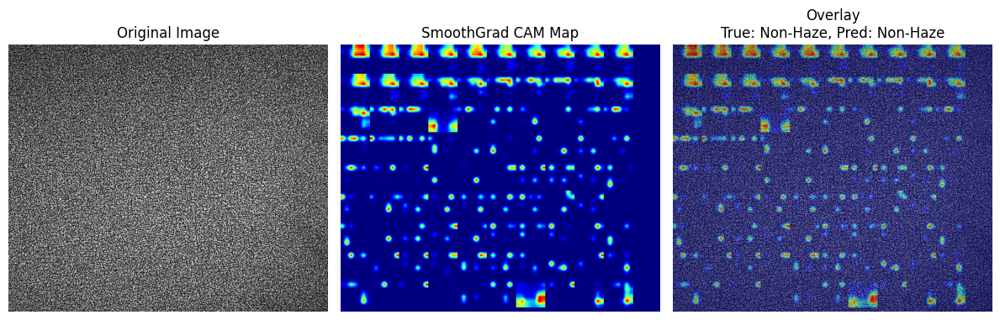

[GRADCAM PATCHED] True: Haze, Pred: Haze, Path: Dissertation/haze/120cm_0245.tiff


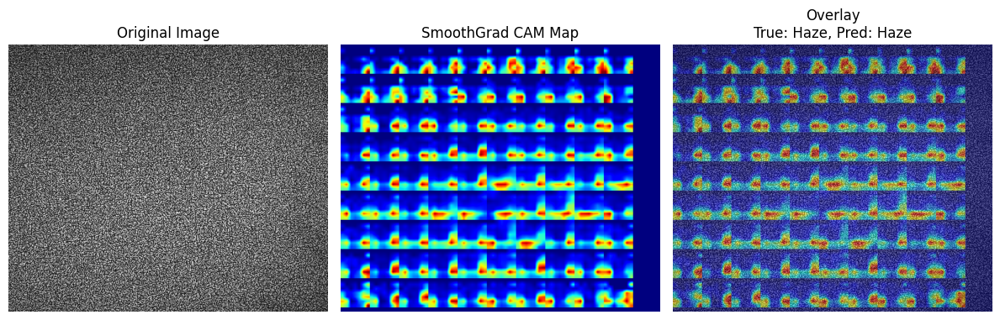

In [73]:
# Assume test_data = [(path1, label1), (path2, label2), ...]
for path, label in test_data[:5]:
    gradcam_on_patched_tiff(
        tiff_path=path,
        model=model,
        gradcam=gradcam,
        transform=val_transform,
        device=device,
        patch_size=224,
        stride=224,
        true_label=label
    )



## Frequency Charts (Heat-Source Distance Analysis)

In [74]:
import os
from collections import defaultdict
import matplotlib.pyplot as plt

# Your prediction data
results = all_results  # assumed format: (true_label, pred_label, image_path)

# New distance-aware grouping
counts = defaultdict(lambda: {"Haze": 0, "Non-Haze": 0})
distances_found = set()

for true_label, pred_label, path in results:
    filename = os.path.basename(path)

    # Extract distance from filename like "0cm_0057.tiff" or fallback to "Control"
    dist = "Control"
    match = re.match(r"(\d+)cm", filename)
    if match:
        dist = f"{match.group(1)}cm"
    distances_found.add(dist)

    label = "Haze" if "haze" in path.lower() else "Non-Haze"
    counts[dist][label] += 1

# Now sort the distances numerically, placing Control last
distances_sorted = sorted(
    [d for d in distances_found if d != "Control"],
    key=lambda x: int(x.replace("cm", ""))
) + (["Control"] if "Control" in distances_found else [])

# Plotting
bar_width = 0.4
x = range(len(distances_sorted))

haze_counts = [counts[d]["Haze"] for d in distances_sorted]
nonhaze_counts = [counts[d]["Non-Haze"] for d in distances_sorted]

plt.figure(figsize=(12, 6))
plt.bar(x, haze_counts, width=bar_width, label="Haze", color="royalblue")
plt.bar([i + bar_width for i in x], nonhaze_counts, width=bar_width, label="Non-Haze", color="darkorange")
plt.xlabel("Heat Source Distance")
plt.ylabel("Patch Count")
plt.title("Frequency of Haze and Non-Haze Patches per Heat Source Distance")
plt.xticks([i + bar_width / 2 for i in x], distances_sorted)
plt.legend()
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()



NameError: name 'all_results' is not defined

## 2. Feature Clustering (t-SNE on Model Embeddings)

In [ ]:
import torch
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np

# Optional: Use UMAP instead of t-SNE (install via pip install umap-learn)
use_umap = False
if use_umap:
    import umap

# --------- Step 1: Extract Features from Model ---------

def extract_features(model, dataloader, device):
    model.eval()
    features, labels, paths = [], [], []

    with torch.no_grad():
        for images, lbls, filepaths in dataloader:  # Your dataset must return paths
            images = images.to(device)
            output = model(images)
            feats = output.cpu().numpy()  # Replace with penultimate layer if needed

            features.extend(feats)
            labels.extend(lbls.cpu().numpy())
            paths.extend(filepaths)

    return np.array(features), labels, paths

# --------- Step 2: Normalize + Dim Reduction ---------

def reduce_and_cluster(features, n_clusters=5):
    scaler = StandardScaler()
    scaled = scaler.fit_transform(features)

    n_components = min(50, scaled.shape[0], scaled.shape[1])
    pca = PCA(n_components=n_components)
    reduced = pca.fit_transform(scaled)

    reducer = umap.UMAP(n_neighbors=15, min_dist=0.1) if use_umap else TSNE(n_components=2, perplexity=40)
    embedded = reducer.fit_transform(reduced)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_ids = kmeans.fit_predict(reduced)

    return embedded, cluster_ids, kmeans


# --------- Step 3: Plot ---------

def plot_embedding(embedded, cluster_ids, labels=None, title="t-SNE + KMeans"):
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(embedded[:, 0], embedded[:, 1], c=cluster_ids, cmap='tab10', s=10, alpha=0.8)

    if labels is not None:
        for i in np.unique(labels):
            idxs = np.array(labels) == i
            plt.scatter([], [], label=f"Label {i} ({np.sum(idxs)})")

    plt.legend()
    plt.title(title)
    plt.xlabel("Dim 1")
    plt.ylabel("Dim 2")
    plt.grid(True)
    plt.show()


In [ ]:
# Step 1
features, labels, paths = extract_features(model, test_loader_analysis, device)

# Step 2
embedded, cluster_ids, kmeans = reduce_and_cluster(features, n_clusters=5)

# Step 3
plot_embedding(embedded, cluster_ids, labels, title="t-SNE Embedding with KMeans Clusters")


## Severity Scoring (Softmax-based)

In [ ]:
patch_scores = defaultdict(list)

model.eval()
with torch.no_grad():
    for images, _, paths in tqdm(test_loader):
        images = images.to(device)
        probs = torch.softmax(model(images), dim=1)[:, 0]  # Haze probability

        for path, p in zip(paths, probs.cpu().numpy()):
            base = os.path.basename(path)
            patch_scores[base].append(p)

# Aggregate scores per image (optional)
for patch, scores in patch_scores.items():
    avg_score = np.mean(scores)
    print(f"[{patch}] Avg Haze Score: {avg_score:.3f}")


In [ ]:
image_level = defaultdict(list)
for patch_name, scores in patch_scores.items():
    base_tiff = "_".join(patch_name.split("_")[:2]) + ".tiff"  # match to original TIFF
    image_level[base_tiff].extend(scores)

for tiff_name, scores in image_level.items():
    print(f"{tiff_name} - Mean Haze Severity: {np.mean(scores):.3f}")
